# [IAPR][iapr]: Project


**Group ID:** xx

**Author 1 (sciper):** Alexandre de Montleau (288111)  
**Author 2 (sciper):** Camil Eutamene (287038)   
**Author 3 (sciper):** Jason Mina (355142)   

**Release date:** 27.04.2023


## Important notes

The assignments are designed to teach practical implementation of the topics presented during class as well as preparation for the final project, which is a practical project which ties together the topics of the course. 

As such, in the lab assignments/final project, unless otherwise specified, you may, if you choose, use external functions from image processing/ML libraries like opencv and sklearn as long as there is sufficient explanation in the lab report. For example, you do not need to implement your own edge detector, etc.

**! Before handling back the notebook !** rerun the notebook from scratch `Kernel` > `Restart & Run All`


[iapr]: https://github.com/LTS5/iapr

---
## 0. Introduction

In this project, you will be working on solving tiling puzzles using image analysis and pattern recognition techniques. Tiling puzzles are a classic type of puzzle game that consists of fitting together pieces of a given shape (in this case squared to form a complete image. The goal of this project is to develop an algorithm that can automatically reconstruct tiling puzzles from a single input image. 

---

## 1. Data

### Input data
To achieve your task, you will be given images that look like this:


![train_00.png](data_project/project_description/train_00.png)

### Example puzzle content
Example of input of solved puzzles. 
Solution 1
<img src="data_project/project_description/solution_example.png" width="512"/>
Solution 2
<img src="data_project/project_description/solution_example2.jpg" width="512"/>


### 1.1. Image layout

- The input for the program will be a single image with a size of __2000x2000 pixels__, containing the pieces of the tiling puzzles randomly placed in it. The puzzles sizes vary from __3x3, 3x4, or 4x4__ size. 
    -__You are guaranteed to always have the exact number of pieces for each puzzle__ 
        -For each puzzle you always are expected to find exaclty 9,12,16 pieces
        -If you find something else, either you are missing pieces, or added incorrect pieces for the puzzle

- The puzzle pieces are square-shaped with dimensions of 128x128 pixels (before rotation). 

- The input image will contain pieces from __two or three (but never four)__ different tiling puzzles, as well as some __extra pieces (outliers)__ that do not belong to either puzzle.


## 2. Tasks (Total 20 points) 


The project aims to:
1) Segment the puzzle pieces from the background (recover the pieces of 128x128 pixels)   \[ __5 points__ \] 

2) Extract features of interest from puzzle pieces images \[ __5 points__ \]   

3) Cluster puzzle pieces to identify which puzzle they belong, and identify outliers.  \[ __5 points__ \]   

4) Solve tiling puzzle (find the rotations and translations to correctly allocate the puzzle pieces in a 3x3, 3x4 or 4x4 array.) \[ __5 points__ \]   

##### The images used for the puzzles have self-repeating patterns or textures, which ensures that all puzzle pieces contain more or less the same features regardless of how they were cut. 




### 1.2. Output solution pieces.

For each inpute image, the output solution will include N images with solved puzzles, where N is the number of puzzles in the input image. and M images, that are Each of these images will contain the solved solution to one of the N puzzles in the input. 


-  Example input:  train_05.png

- Example solution:
        -solution_05_00.png solution_05_01.png solution_05_02.png 
        -outlier_05_00.png outlier_05_01.png outlier_05_02.png ...

- Example input:  train_07.png
- Example solution:
        -solution_07_00.png solution_07_01.png 
        -outlier_07_00.png outlier_07_01.png outlier_07_02.png ...


__Watch out!__ output resolution should always be like this:  
<table ><tr><th >Puzzle pieces <th><th> pixel dimentions <th> <th> pixel dimentions <th> <tr>
<tr><td> 3x3 <td><td> 384x384 <td><td> 3(128)x3(128) <td> <tr>
<tr><td> 3x4 <td><td> 384x512 <td><td> 3(128)x4(128)<tr>
<tr><td> 4x4 <td><td> 512x512 <td><td> 4(128)x4(128)<tr>
<tr><td> 1x1 (outlier)<td><td> 128x128 <td><td> (1)128x(1)128 <td><tr><table>





__Order of the solutions (and rotations) it's not a problem for the grading__




the output solution will be a final image of resolution (1283)x(1283), with each piece correctly placed in its corresponding location in the 3x3 array. Similarly, if the puzzle consists of 3x4 or 4x4 pieces, the output solution will be an image of resolution (1283)x(1284) or (1284)x(1284)



### 1.3 Data folder Structure

You can download the data for the project here: [download data](https://drive.google.com/drive/folders/1k3xTH0ZhpqZb3xcZ6wsOSjLzxBNYabg3?usp=share_link)

```
data_project
│
└─── project_description
│    │    example_input.png      # example input images
│    │    example_textures1.png      # example input images
│    │    example_textures2.png      # example input images
│    └─── ultimate_test.jpg   # If it works on that image, you would probably end up with a good score
│
└─── train
│    │    train_00.png        # Train image 00
│    │    ...
│    │    train_16.png        # Train image 16
│    └─── train_labels.csv    # Ground truth of the train set
|    
└────train_solution
│    │    solution_00_00.png        # Solution puzzle 1 from Train image 00
│    │    solution_00_01.png        # Solution puzzle 2 from Train image 00
│    │    solution_00_02.png        # Solution Puzzle 3 from Train image 00
│    │    outlier_00_00.png         # outlier     from Train image 00
│    │    outlier_00_01.png         # outlier     from Train image 00
│    │    outlier_00_03.png         # outlier     from Train image 00
│    │    ...
│    │    solution_15_00.png        # Solution puzzle 1 from Train image 15
│    │    solution_15_01.png        # Solution puzzle 2 from Train image 15
│    │    outlier_15_00.png         # outlier     from Train image 15
│    └─── outlier_15_01.png         # outlier     from Train image 15
│
└─── test
     │    test_00.png         # Test image 00 (day of the exam only)
     │    ...
     └─── test_xx.png             # Test image xx (day of the exam only)
```



## 3. Evaluation

**Before the exam**
   - Create a zipped folder named **groupid_xx.zip** that you upload on moodle (xx being your group number).
   - Include a **runnable** code (Jupyter Notebook and external files) and your presentation in the zip folder.
   
**The day of the exam**
   - You will be given a **new folder** (test folder) with few images, but **no ground truth** (no solutions).
   - We will ask you to run your pipeline in **real time** and to send us your prediction of the task you obtain with the provided function **save_results**. 
   - On our side, we will compute the performance of your classification algorithm. 
   - To evaluate your method, we will use the **evaluate_solution** function presented below. To understand how the provided functions work, please read the documentation of the functions in **utils.py**.
   - **Please make sure your function returns the proper data format to avoid points penalty on the day of the exam**. 
---


## 4. Your code

In [6]:
import PIL.Image
import numpy as np
from typing import Union
from glob import glob
import os
import cv2
from skimage import io
from skimage.filters import threshold_multiotsu
from skimage.transform import rotate
import matplotlib.pyplot as plt
from matplotlib.colors import rgb_to_hsv
from matplotlib.colors import hsv_to_rgb
import skimage.io
## load images
import os 
from PIL import Image

In [7]:
data_path = "data_project2/train2/"

In [8]:
def extract_squares(tot_contour, image):
    # Extracts squares from the image based on the given contours and returns a list of square images.
    squares_img = []
    
    for i in range(len(tot_contour)):
        
        test = tot_contour[i]
        if i%2==0:
            pts1=np.float32([test[0][0],test[1][0],test[2][0],test[3][0]])
        else:
            pts1=np.float32([test[2][0],test[3][0],test[0][0],test[1][0]])
        pts2=np.float32([(0, 0),
                        (0, 128),
                        (128, 128),
                        (128, 0)])
        H=cv2.getPerspectiveTransform(pts1, pts2)
        image1=image.copy()
        image1=cv2.warpPerspective(image1, H, dsize=(128, 128))
        squares_img.append(image1)

    return squares_img


 
def plot_squares(squares_img):
    
    # Plot the puzzle pieces

    num_images = len(squares_img)
    fig, axes = plt.subplots(nrows=4, ncols=7, figsize=(12, 8))
    #fig.tight_layout(pad=0.5)

    for i, ax in enumerate(axes.flat):
        if i < num_images:
            ax.imshow(squares_img[i], cmap='gray')  # Assuming grayscale images
            ax.axis('off')

    plt.show()

In [9]:
# Given function to save mask of puzzle pieces
def save_mask(image_index , solution, path = "data_project", group_id = "30"):
    saving_path = os.path.join(path , "solutions_group_" + str(group_id) )
    if not os.path.isdir(saving_path):
        os.mkdir(saving_path)
    print("saving solutions in folder: " , saving_path)
    filename = os.path.join(saving_path, f"mask_{str(image_index).zfill(2)}.png")
    if solution.shape[0] != 2000 or solution.shape[1] != 2000:
        print("error in mask:  shape of image" , solution.shape)
        return
    if np.max(solution) ==1:
        solution = solution*255
    solution = np.array(solution , dtype = np.uint8)
    Image.fromarray(solution).save(filename)

0  : 28


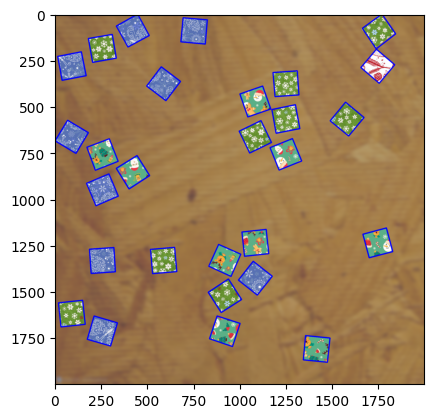

1  : 21


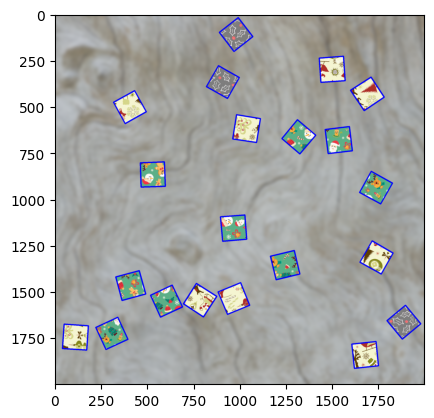

2  : 28


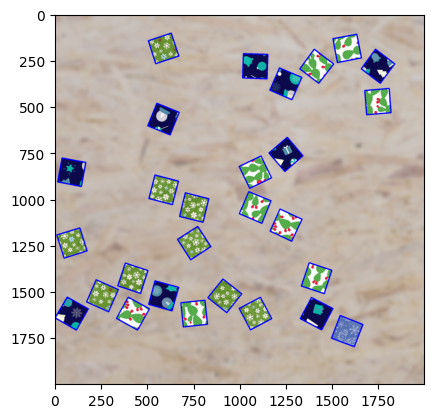

3  : 21


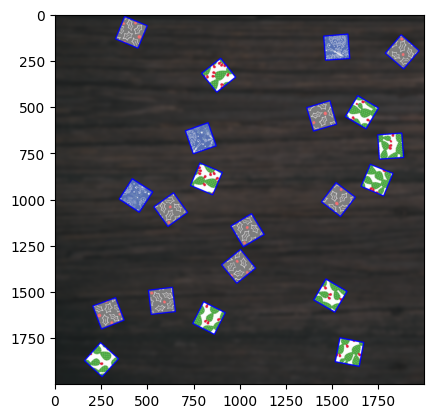

4  : 20


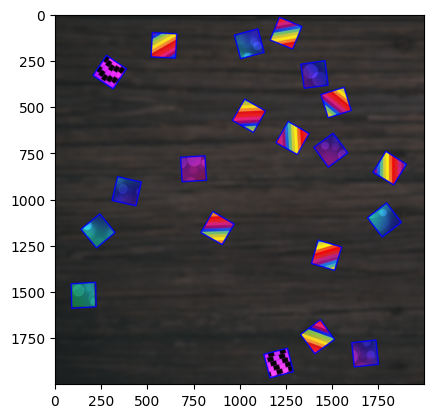

5  : 28


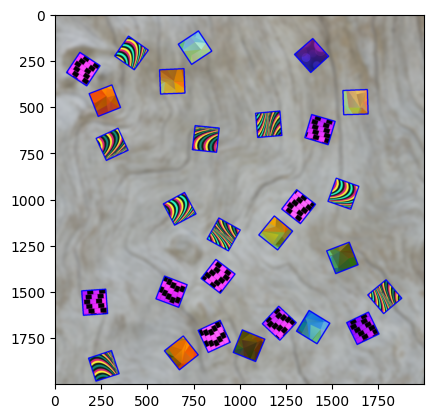

6  : 29


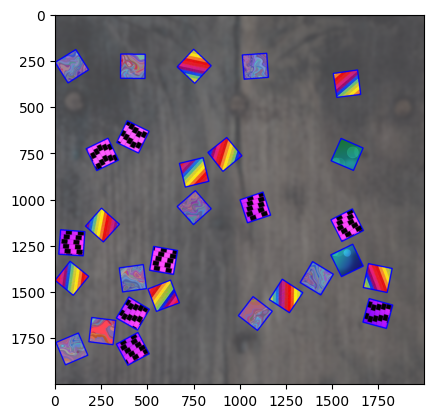

7  : 28


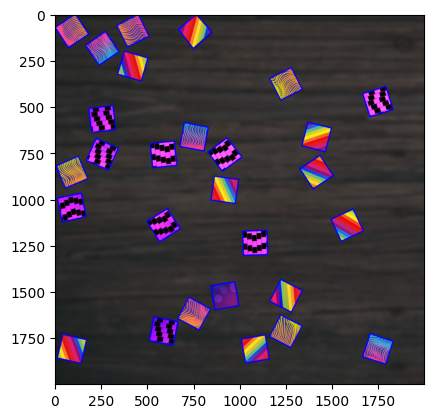

8  : 27


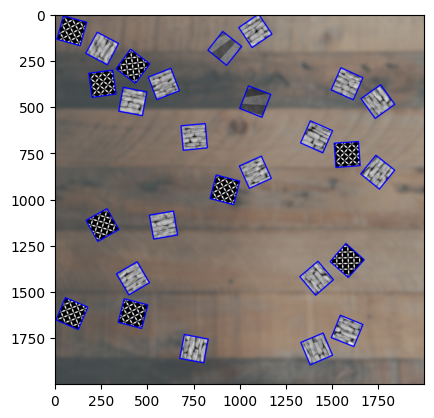

9  : 29


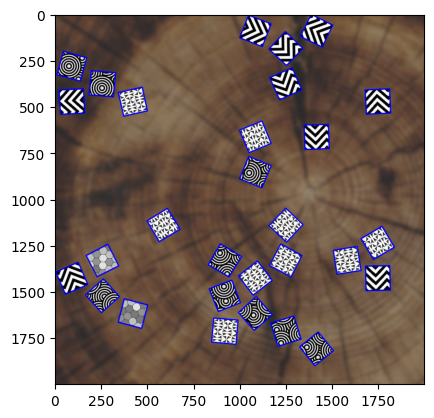

10  : 28


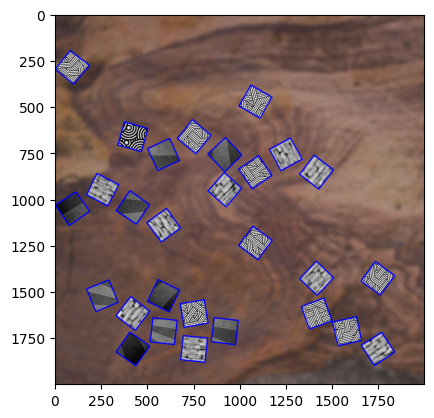

11  : 19


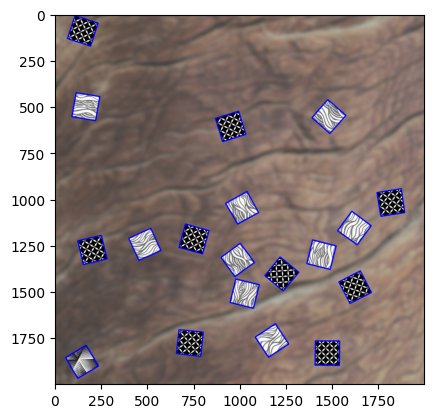

In [10]:
mask = np.random.randint(0,2,(2000,2000))

def findSquaresInImage(image):
    squares = []
    image=cv2.Laplacian(image, cv2.CV_64F)  # Apply Laplacian filter to enhance edges
    image=cv2.convertScaleAbs(image) # Convert the filtered image to absolute values
    pyr1 = cv2.pyrDown(image) # Perform image pyramid downscaling
    timg1 = cv2.pyrUp(pyr1) # Perform image pyramid upscaling
    gray01 = cv2.cvtColor(image, cv2.COLOR_BGR2GRAY) # Convert the image to grayscale
    gray1 = np.empty_like(gray01) # Create an empty array of the same shape as gray01

    N = 11 # Number of iterations for the loop
    # Iterate over different threshold values
    for thresh in [200,500,800]:
        # Iterate over different epsilon values
        for eps in np.arange(0.02, 0.08, 0.02):
             # Iterate over different kernel sizes
            for k in [1,3,4,6]:
                pyr=pyr1
                timg=timg1
                gray0=gray01
                gray=gray1
                # Iterate over each channel in the image
                num_channel = 3
                for c in range(num_channel):
                        ch = [c, 0]  # Create a list of channel indices for mixing channels
                        cv2.mixChannels([timg], [gray0], ch) # Mix channels from timg to gray0

                        for l in range(N):
                            if l == 0:
                                gray = cv2.Canny(gray0, 0, thresh, apertureSize=5) # Apply Canny edge detection
                                gray = cv2.dilate(gray, None)
                                if k!=1:
                                    kernel = cv2.getStructuringElement(cv2.MORPH_ELLIPSE, (k-1,k-1))
                                else:
                                    kernel = cv2.getStructuringElement(cv2.MORPH_ELLIPSE, (1,1))
                                gray = cv2.morphologyEx(gray, cv2.MORPH_CLOSE, kernel, iterations=k) # Perform morphological closing
                                gray = cv2.morphologyEx(gray, cv2.MORPH_OPEN, kernel, iterations=k) # Perform morphological opening
                            else:
                                gray = (gray0 >= (l + 1) * 255 / N).astype(np.uint8) # Threshold the image


                            contours, _ = cv2.findContours(gray, cv2.RETR_LIST, cv2.CHAIN_APPROX_SIMPLE) # Find contours in the image

                            for contour in contours:
                                approx = cv2.approxPolyDP(contour, cv2.arcLength(contour, True) * eps, True)  # Approximate the contour with a polygon
                                condition=False
                                # Check conditions for the contour to be a square
                                if len(approx) == 4:
                                            condition= (abs(abs(distance(approx[0],approx[1]))-abs(distance(approx[1],approx[2])))<5 and abs((abs(distance(approx[1],approx[2]))-abs(distance(approx[2],approx[3]))))<5 and abs((abs(distance(approx[0],approx[1]))-abs(distance(approx[2],approx[3]))))<5)

                                if len(approx) == 4 and cv2.contourArea(approx) > 13000 and cv2.contourArea(approx) < 18000  and cv2.isContourConvex(approx) and condition:
                                            maxCosine = 0

                                            for j in range(2, 5):
                                                cosine = np.abs(angle(approx[j % 4], approx[j - 2], approx[j - 1]))
                                                maxCosine = max(maxCosine, cosine)

                                            if maxCosine < 0.3 :
                                                squares.append(approx)
                
    distance_threshold = 20   
    squares=keep_one_contour(squares,distance_threshold)

    return squares
def keep_one_contour(contours, distance_threshold):
    # Calculate the centroid of each contour
    centroids = []
    for contour in contours:
        M = cv2.moments(contour)
        cx = int(M['m10'] / M['m00'])
        cy = int(M['m01'] / M['m00'])
        centroids.append((cx, cy))

    # Calculate the pairwise distances between centroids
    num_contours = len(contours)
    is_close = np.zeros((num_contours, num_contours), dtype=bool)
    for i in range(num_contours):
        for j in range(i + 1, num_contours):
            dist = np.linalg.norm(np.array(centroids[i]) - np.array(centroids[j]))
            if dist < distance_threshold:
                is_close[i, j] = True
                is_close[j, i] = True

    # Create a new list of contours keeping only one of the largest contours from each close group
    filtered_contours = []
    visited_indices = set()
    for i in range(num_contours):
        if i not in visited_indices:
            largest_contour_index = i
            largest_contour_area = cv2.contourArea(contours[i])
            for j in range(i + 1, num_contours):
                if is_close[i, j]:
                    visited_indices.add(j)
                    contour_area = cv2.contourArea(contours[j])
                    if contour_area > largest_contour_area:
                        largest_contour_index = j
                        largest_contour_area = contour_area
            filtered_contours.append(contours[largest_contour_index])

    return filtered_contours

def distance(point1, point2):
    # Compute distance between point 1 and 2
    x1 = point1[0][0]
    y1=point1[0][1]
    x2 = point2[0][0]
    y2=point2[0][1]
    distance = np.sqrt((x2 - x1)**2 + (y2 - y1)**2)
    return distance

def angle(pt1, pt2, pt0):
    # Compute angle between vectors defined by 3 points
    dx1 = pt1[0][0] - pt0[0][0]
    dy1 = pt1[0][1] - pt0[0][1]
    dx2 = pt2[0][0] - pt0[0][0]
    dy2 = pt2[0][1] - pt0[0][1]
    return (dx1 * dx2 + dy1 * dy2) / np.sqrt((dx1 * dx1 + dy1 * dy1) * (dx2 * dx2 + dy2 * dy2) + 1e-10)

def debugSquares(squares, image):
    for i, square in enumerate(squares):
        cv2.drawContours(image, [square], 0, (0, 0, 255), 5, cv2.LINE_8)

       

    return image

nb_images = len(os.listdir(data_path))

tot_squares = []
tot_masks = []

for i in range(nb_images):
    image_path = data_path + "train_"
    if i<10:
        image = io.imread(image_path+"0"+str(i)+".png")
    else:
        image = io.imread(image_path+str(i)+".png")
    
    #extract squares
    squares=findSquaresInImage(image)
    tot_squares.append(extract_squares(squares, image))
    image1=image.copy()
    
    print(i," :",len(squares))
    image1=debugSquares(squares, image)
    plt.imshow(image1)
    plt.show()
    mask = np.zeros_like(image)

# Set the pixels inside the contours to 1
    cv2.drawContours(mask, squares, -1, (255), thickness=cv2.FILLED)
    # Create a result matrix with the same dimensions as the image
    result_matrix = np.zeros_like(image, dtype=np.uint8)
    # Set the values in the result matrix based on the mask image
    result_matrix[np.where(mask == 255)] = 1

    tot_masks.append(result_matrix) 

## Question 2: Feature extraction

In [11]:
%matplotlib inline
  
 
def showimage(myimage, figsize=[10,10]):
    if (myimage.ndim>2):  #This only applies to RGB or RGBA images (e.g. not to Black and White images)
        myimage = myimage[:,:,::-1] #OpenCV follows BGR order, while matplotlib likely follows RGB order
         
    fig, ax = plt.subplots(figsize=figsize)
    ax.imshow(myimage, cmap = 'gray', interpolation = 'bicubic')
    plt.xticks([]), plt.yticks([])  # to hide tick values on X and Y axis
    plt.show()

In [12]:
def apply_filter(img, filters):
# This general function is designed to apply filters to our image
     
    # First create a numpy array the same size as our input image
    newimage = np.zeros_like(img)
     
    # Starting with a blank image, we loop through the images and apply our Gabor Filter
    # On each iteration, we take the highest value (super impose), until we have the max value across all filters
    # The final image is returned
    depth = -1 # to keep  depth same as original image
     
    for kern in filters:  # Loop through the kernels in our GaborFilter
        image_filter = cv2.filter2D(img, depth, kern)  #Apply filter to image
         
        # Using Numpy.maximum to compare our filter and cumulative image, taking the higher value (max)
        np.maximum(newimage, image_filter, newimage)
    return newimage

In [13]:
def apply_canny(image_feature_to_extract, blurring_kernel_size = 5):
    d=[1,3,5,7]
    for blurring_kernel_size in d:
        gray_image_feature_to_extract = cv2.cvtColor(image_feature_to_extract, cv2.COLOR_BGR2GRAY)

        #blurring_kernel_size = 5
        blurred_image_feature_to_extract = gray_image_feature_to_extract

        # Apply Canny edge detection
        #edges = cv2.Canny(blurred_image_feature_to_extract, 100, 180)
        edges=[]
        for i in range (0,150,30):
            for j in range(50,200,30):
                edges.append(cv2.Canny(blurred_image_feature_to_extract, i,j))
    
    return edges


def create_gaborfilter():
    # This function is designed to produce a set of GaborFilters 
    # an even distribution of theta values equally distributed amongst pi rad / 180 degree
     
    filters = []
    num_filters = 16
    ksize = 10  # The local area to evaluate
    sigma = 2.0  # Larger Values produce more edges
    lambd = 25.0
    gamma = 0.5
    psi = 0  # Offset value - lower generates cleaner results
    for theta in np.arange(-2*np.pi, 2*np.pi, np.pi / num_filters):  # Theta is the orientation for edge detection
        kern = cv2.getGaborKernel((ksize, ksize), sigma, theta, lambd, gamma, psi, ktype=cv2.CV_64F)
        kern /= 1.0 * kern.sum()  # Brightness normalization
        filters.append(kern)
    return filters

def extract_edge_histogram(edges, num_bins):
    # Calculate the histogram of edge orientations
    histogram, _ = np.histogram(edges, bins=num_bins, range=(0, 256), density=True)
    
    return histogram

def plot_squares(squares_img, labels):
    num_images = len(squares_img)
    largest_size = max(max(img.shape) for img in squares_img)  # Determine the largest square size
    num_cols = min(7, num_images)  # Maximum number of columns is 7
    num_rows = (num_images + num_cols - 1) // num_cols  # Calculate the number of rows

    fig, axes = plt.subplots(nrows=num_rows, ncols=num_cols, figsize=(12, 8))

    for i, ax in enumerate(axes.flat):
        if i < num_images:
            ax.imshow(squares_img[i], cmap='gray')
            ax.axis('off')
            ax.set_title(labels[i])
            # Adjust subplot size based on the largest square
            ax.set_aspect('equal', 'box')
            ax.set_xlim([0, largest_size])
            ax.set_ylim([largest_size, 0])
            
    
    print("PUZZLE:")

    plt.tight_layout()
    plt.show()


In [14]:
# We create our gabor filters
gfilters = create_gaborfilter()

In [15]:
def extract_contour_histogram(contour, num_bins):
    # Compute histogram of contour features
    contour_length = 100*cv2.arcLength(contour, closed=True)
    hist, _ = np.histogram(contour_length, bins=num_bins, range=(0, contour_length), density=True)
    return hist

## Question 3: clustering

In [16]:
# FOR SOLUTION 1

def save_feature_map(image_index , solution, path = "data_project", group_id = "30"):
    saving_path = os.path.join(path , "solutions_group_" + str(group_id) )
    if not os.path.isdir(saving_path):
        os.mkdir(saving_path)
    print("saving solutions in folder: " , saving_path)
    filename = os.path.join(saving_path, f"feature_map_{str(image_index).zfill(2)}.txt")
    np.savetxt(filename , solution)

    #min max into 0 ,255 interval
    solution = (solution - np.min(solution)) / (np.max(solution) - np.min(solution))
    solution = np.array(solution*255 , dtype = np.uint8)
    filename = filename.replace(".txt" , ".png")
    Image.fromarray(solution).save(filename)

In [17]:
#FOR SOLUTION 2

def sort_lists_by_length(list_of_lists):
    sorted_lists = sorted(list_of_lists, key=len, reverse=True)
    return sorted_lists

def create_image_clusters(image_array, label_clusters):
    image_clusters = [[] for _ in range(len(np.unique((label_clusters))))]  # Create an empty list of lists
   
    for j in list(np.unique(label_clusters)):
    
        for i in range(len(image_array)):
            
            if label_clusters[i] == j:
                
                correct_index = list(np.unique(label_clusters)).index(j)

                image_clusters[correct_index].append(image_array[i])
                
        
    sorted_lists = sort_lists_by_length(image_clusters)
        
    return sorted_lists

In [18]:
from sklearn.metrics import silhouette_score
from sklearn.cluster import KMeans
def find_correct_cluster_number(features):

    # Set the range of cluster numbers to evaluate
    min_clusters = 2
    max_clusters = 5

    # Perform K-means clustering for different numbers of clusters
    sse = []
    for n_clusters in range(min_clusters, max_clusters+1):
        kmeans = KMeans(n_clusters=n_clusters, n_init = 20)
        kmeans.fit(features)
        sse.append(kmeans.inertia_)  # SSE
        
        
    diff = []

    for p in range(1,len(sse)):

        diff.append(sse[p] - sse[p-1])
    
    correct_cluster_nb1 = np.argmin(diff) + min_clusters + 1
    min_clusters = 2
    max_clusters = 5
    
    # Perform K-means clustering for different numbers of clusters
    silhouette_scores = []
    for n_clusters in range(min_clusters, max_clusters+1):
        kmeans = KMeans(n_clusters=n_clusters, n_init=20)
        cluster_labels = kmeans.fit_predict(features)
        silhouette_avg = silhouette_score(features, cluster_labels)
        silhouette_scores.append(silhouette_avg)
    
    # Find the correct number of clusters using the silhouette analysis method
    correct_cluster_nb2 = np.argmax(silhouette_scores) + min_clusters
    correct_cluster_nb= ( correct_cluster_nb2+ correct_cluster_nb1+1)/2
    print(correct_cluster_nb)
    correct_cluster_nb=int(correct_cluster_nb)
    return correct_cluster_nb

In [19]:
from sklearn.preprocessing import MinMaxScaler
from skimage.feature import local_binary_pattern
from sklearn.cluster import SpectralClustering
from sklearn.cluster import AgglomerativeClustering

def apply_clustering(rand_img):
    
    feature_vectors_canny = []
    feature_vectors_gabor = []

    #Apply filters
    for squares in rand_img:
        
        edges = apply_canny(squares, blurring_kernel_size = 5)
        #feature_vectors_canny.append(edges.flatten())
        feature_vectors_canny.append(edges)
        #gabor part
        gabor = apply_filter(squares, gfilters)
        image_g_hsv = cv2.cvtColor(gabor, cv2.COLOR_BGR2HSV)
        #image_g_hsv_flat = image_g_hsv.reshape((-1))
        feature_vectors_gabor.append(image_g_hsv)
        
    #Exctract features
    contour_features=[]
    hist_canny = []
    hist_gabor = []

    feat_canny = []
    feat_gabor = []

    feat_channel_0 = []
    feat_channel_1 = []
    feat_channel_2 = []

    hist_channel_0 = []
    hist_channel_1 = []
    hist_channel_2 = []
    
    texture_features=[]
    fourier_desc=[]
    scaler = MinMaxScaler()

    for vect in feature_vectors_canny:

        hist_canny.append(extract_edge_histogram(vect, num_bins=2))
        feat_canny.append([np.mean(vect), np.std(vect)])


    for vect in feature_vectors_gabor:

        hist_gabor.append(extract_edge_histogram(vect, num_bins=2))
        feat_gabor.append([np.mean(vect), np.std(vect)])

    for vect in rand_img:
        
        vect=cv2.cvtColor(vect, cv2.COLOR_BGR2HSV)
        hist_channel_0.append(extract_edge_histogram(vect[:,:,0], num_bins=2))
        hist_channel_1.append(extract_edge_histogram(vect[:,:,1], num_bins=2))
        hist_channel_2.append(extract_edge_histogram(vect[:,:,2], num_bins=2))

        feat_channel_0.append([np.mean(vect[:,:,0]), np.std(vect[:,:,0])])
        feat_channel_1.append([np.mean(vect[:,:,1]), np.std(vect[:,:,1])])
        feat_channel_2.append([np.mean(vect[:,:,2]), np.std(vect[:,:,2])])

    for img in rand_img:
        gray = cv2.cvtColor(img, cv2.COLOR_BGR2GRAY)

        # Compute Local Binary Pattern (LBP)
        lbp = local_binary_pattern(gray, 8, 1, method='uniform')
        hist_lbp, _ = np.histogram(lbp.ravel(), bins=np.arange(0, 10), range=(0, 10), density=True)
        texture_features.append(hist_lbp)

        contours, _ = cv2.findContours(gray, cv2.RETR_EXTERNAL, cv2.CHAIN_APPROX_SIMPLE)
        contour = contours[0] if len(contours) > 0 else np.array([])

        if len(contour) > 0:
            contour_complex = contour[:, 0, 0] + 1j * contour[:, 0, 1]
            fourier_desc.append(np.fft.fft(contour_complex))
            contour_features.append(extract_contour_histogram(contour, num_bins=2))
        else:
            fourier_desc.append(np.zeros(2))
            contour_features.append(np.zeros(2))  # Handle the case when no contour is found

    # Normalize Fourier descriptors
    fourier_desc = [scaler.fit_transform(desc.real.reshape(-1, 1)).flatten() for desc in fourier_desc]
    hist_canny = scaler.fit_transform(hist_canny)
    hist_gabor = scaler.fit_transform(hist_gabor)
    feat_canny = scaler.fit_transform(feat_canny)
    feat_gabor = scaler.fit_transform(feat_gabor)
    feat_gabor = scaler.fit_transform(feat_gabor)
    hist_channel_0 = scaler.fit_transform( hist_channel_0)
    hist_channel_1 = scaler.fit_transform(hist_channel_1)
    hist_channel_2 = scaler.fit_transform( hist_channel_2)
    feat_channel_0 = scaler.fit_transform(feat_channel_0)
    feat_channel_1 = scaler.fit_transform(feat_channel_1)
    feat_channel_2 = scaler.fit_transform(feat_channel_2)
    contour_features=scaler.fit_transform(contour_features)
    
    texture_features = scaler.fit_transform(texture_features)
    
    max_fourier_dim = max(len(desc) for desc in fourier_desc)
    fourier_desc = [np.pad(desc, (0, max_fourier_dim - len(desc)), mode='constant') for desc in fourier_desc]

    features = np.concatenate([contour_features,hist_canny, hist_gabor, feat_gabor, feat_canny,  hist_channel_0, hist_channel_1, hist_channel_2, feat_channel_0, feat_channel_1, feat_channel_2, fourier_desc,texture_features], axis = 1)
        
    # Apply kmeans algo on features
    num_clusters = find_correct_cluster_number(features)

    # Apply K-means clustering
    kmeans = KMeans(n_clusters=num_clusters, n_init = 20, max_iter = 4000)
    kmeans.fit(features)

    # Get the cluster labels assigned to each image
    cluster_labels = kmeans.labels_
    clustering = AgglomerativeClustering(n_clusters=num_clusters)
    clustering.fit(features)

    # Get the cluster labels
    cluster_labels = clustering.labels_
    cluster_sizes = [np.sum(cluster_labels == label) for label in range(num_clusters)]

    # Identify clusters to merge
    clusters_to_merge = [label for label, size in enumerate(cluster_sizes) if 4 <= size < 9]

    # Merge clusters
    merged_labels = cluster_labels.copy()
    for label in clusters_to_merge:
        merged_labels[cluster_labels == label] = clusters_to_merge[0]

    # Update the cluster labels
    cluster_labels = merged_labels
    merged_cluster_sizes = [np.sum(cluster_labels == label) for label in set(cluster_labels)]

    # Identify merged clusters of size 10
    merged_clusters_size_10 = [label for label, size in enumerate(merged_cluster_sizes) if size == 10]
    
    # Subclustering for merged clusters of size 10
    hist_channel_0 = scaler.fit_transform(hist_channel_0)
    hist_channel_1 = scaler.fit_transform(hist_channel_1)
    hist_channel_2 = scaler.fit_transform(hist_channel_2)
    feat_channel_0 = scaler.fit_transform(feat_channel_0)
    feat_channel_1 = scaler.fit_transform(feat_channel_1)
    feat_channel_2 = scaler.fit_transform(feat_channel_2)

    features1 = np.concatenate([hist_canny,feat_canny,hist_channel_0], axis = 1)

    for size in merged_cluster_sizes:
        if size != 10:
            continue
        else:
            features = features1
    
    for label in merged_clusters_size_10:
        # Get the samples belonging to the merged cluster
        merged_cluster_samples = features1[cluster_labels == label]

        # Apply subclustering on the merged cluster samples
        subclustering = SpectralClustering(n_clusters=2)  # Example: Subcluster into 3 subclusters
        subclustering.fit(merged_cluster_samples)

        # Get the subcluster labels
        subcluster_labels = subclustering.labels_

        # Update the cluster labels for the subclusters
        cluster_labels[cluster_labels == label] = subcluster_labels + num_clusters

    #FOR SOLUTION 2:

    tot_img_solution_2 = create_image_clusters(rand_img, cluster_labels)

    
    plot_squares(rand_img, cluster_labels)
    
    return cluster_labels, tot_img_solution_2, features

saving solutions in folder:  data_project2/solutions_group_00

The autoreload extension is already loaded. To reload it, use:
  %reload_ext autoreload


4.0

PUZZLE:

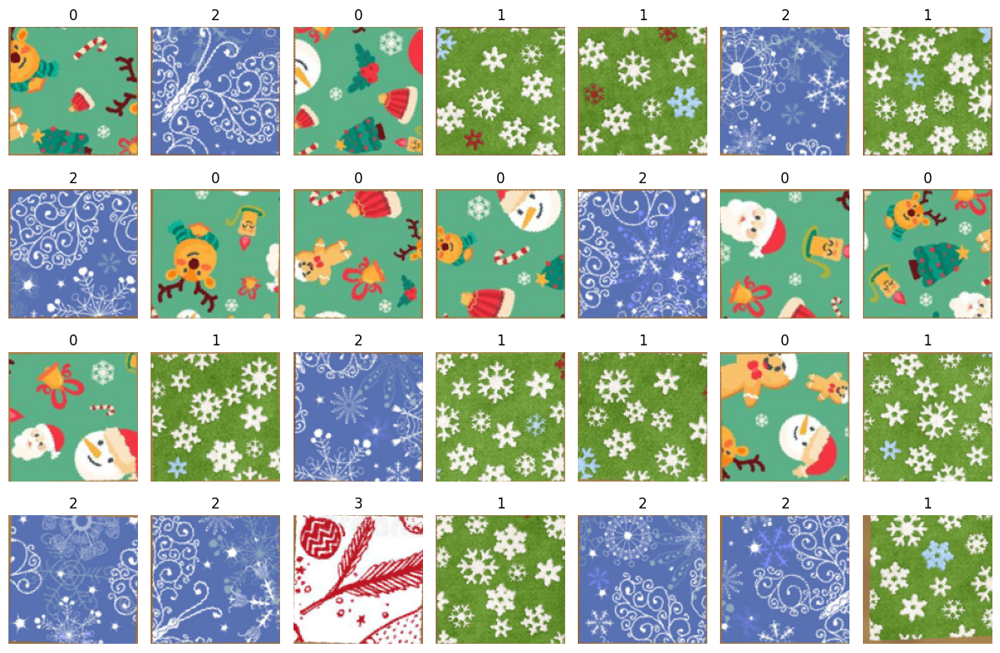

(28, 35)

3.5

PUZZLE:

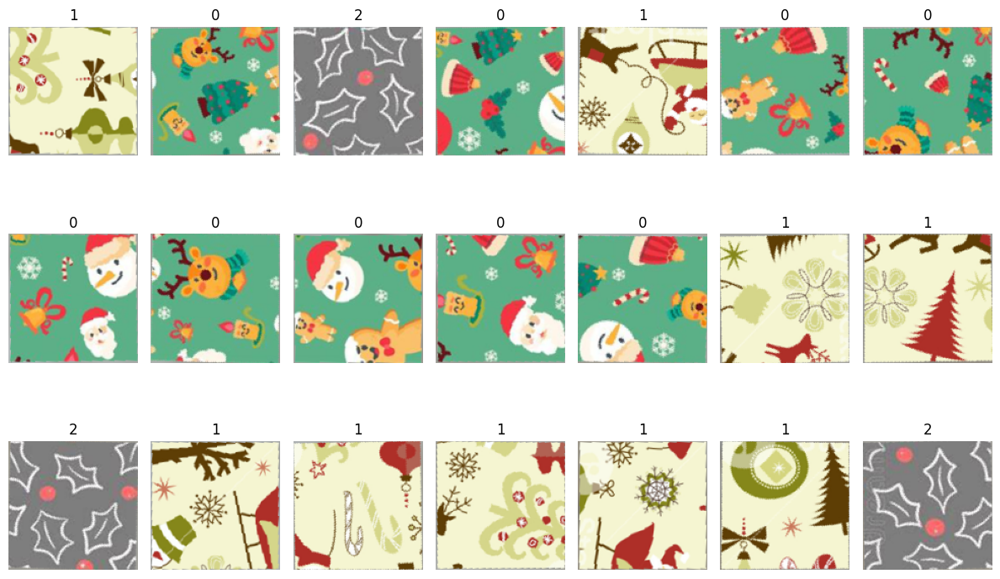

(21, 35)

4.0

PUZZLE:

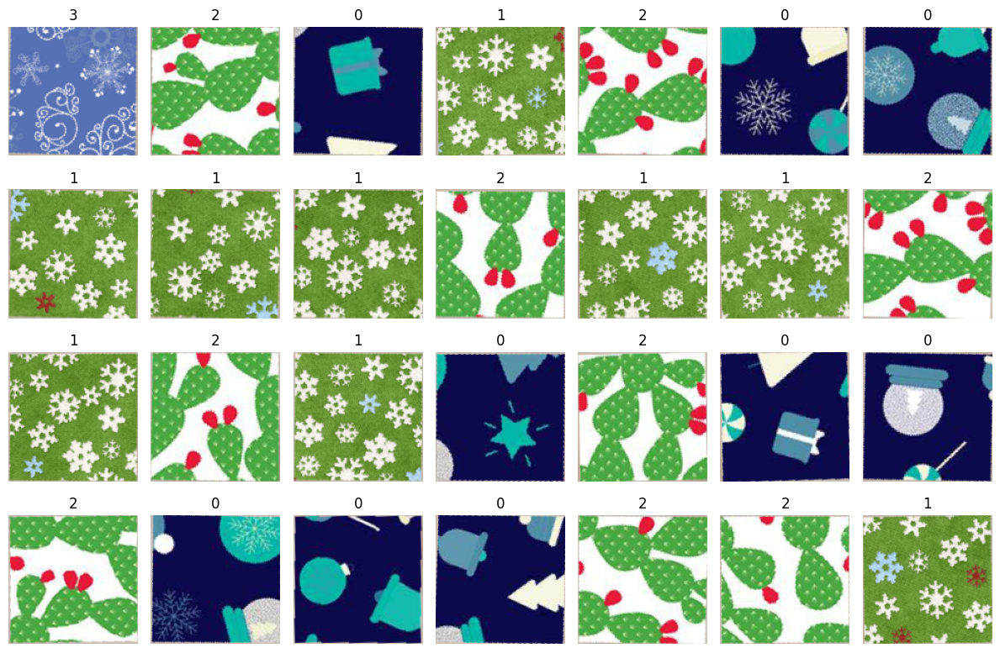

(28, 35)

3.5

PUZZLE:

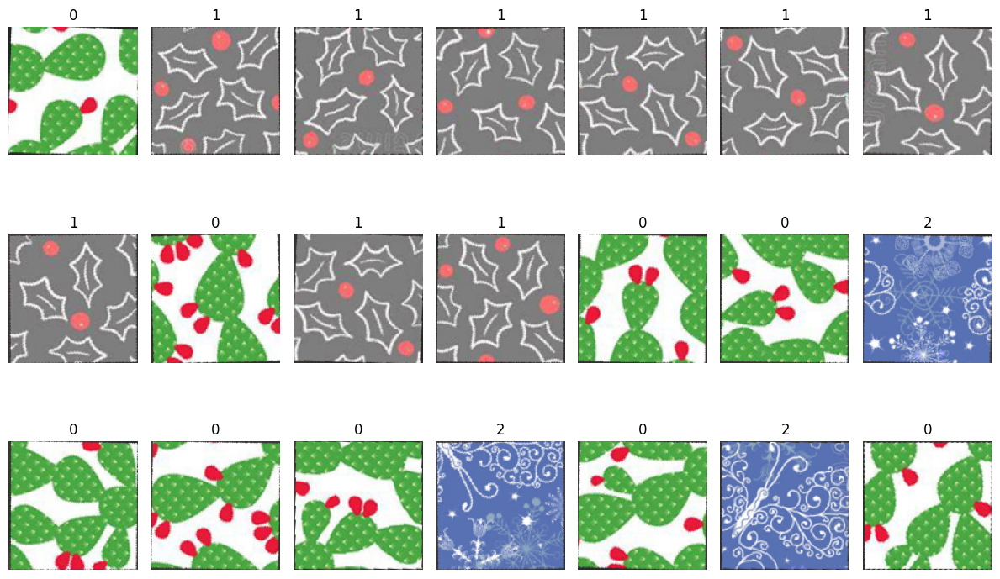

(21, 35)

4.0

PUZZLE:

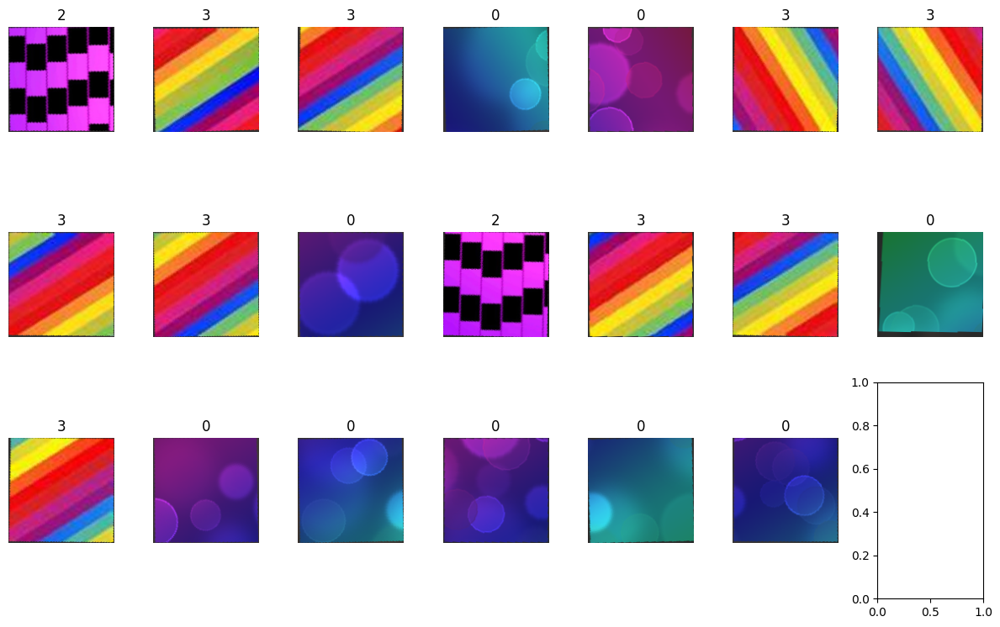

(20, 46)

3.5

PUZZLE:

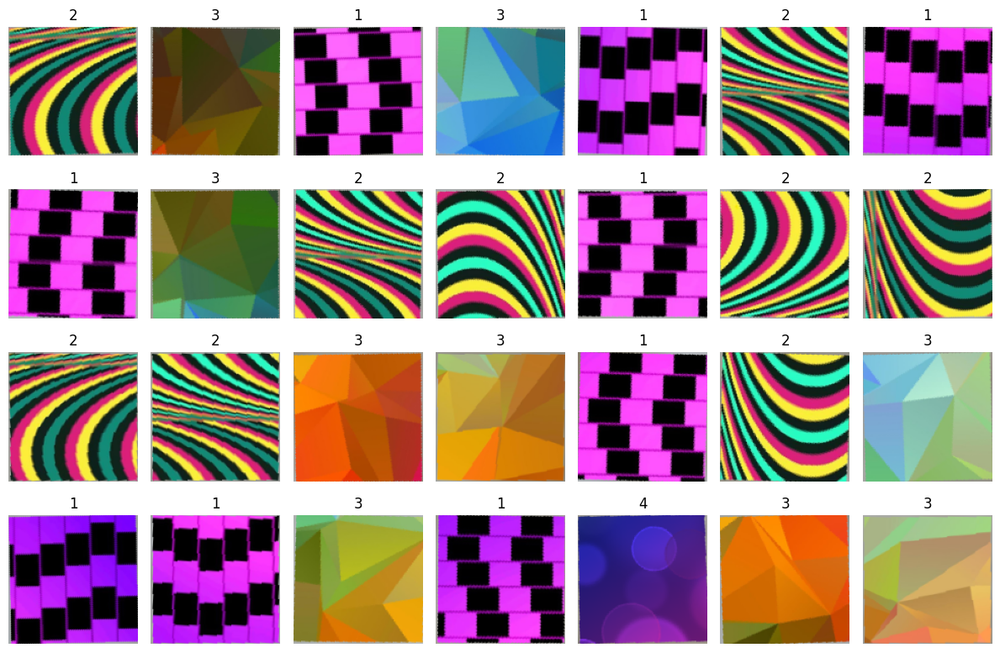

(28, 6)

4.0

PUZZLE:

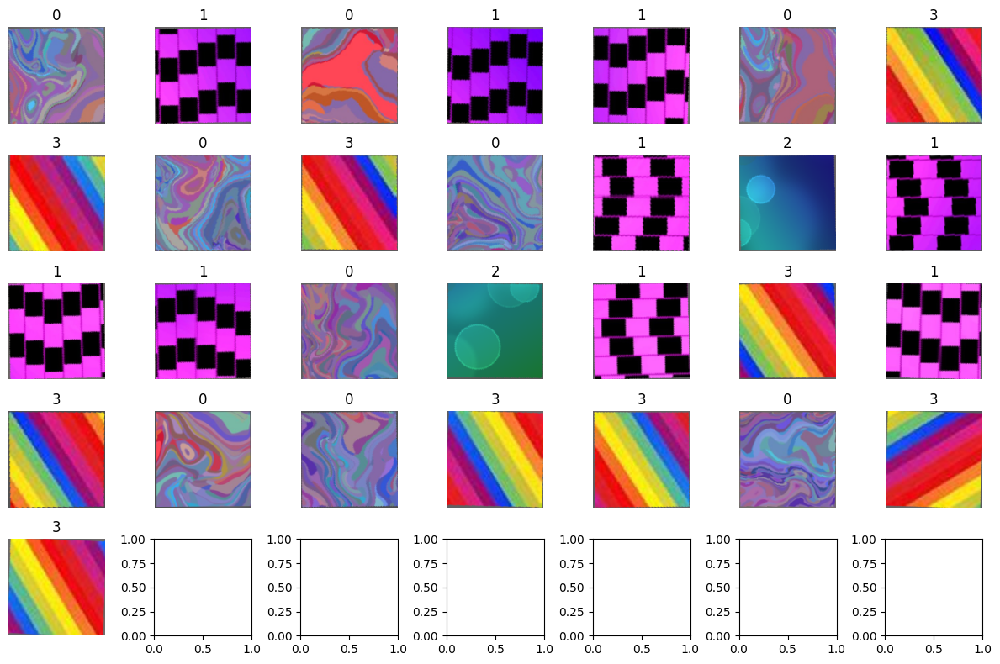

(29, 73)

4.0

PUZZLE:

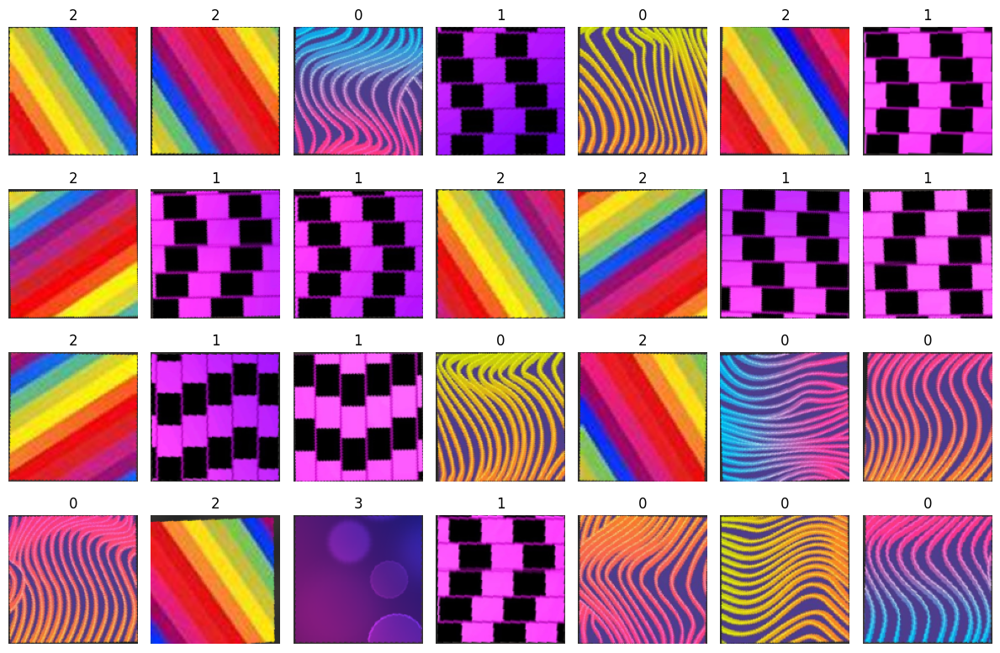

(28, 65)

3.5

PUZZLE:

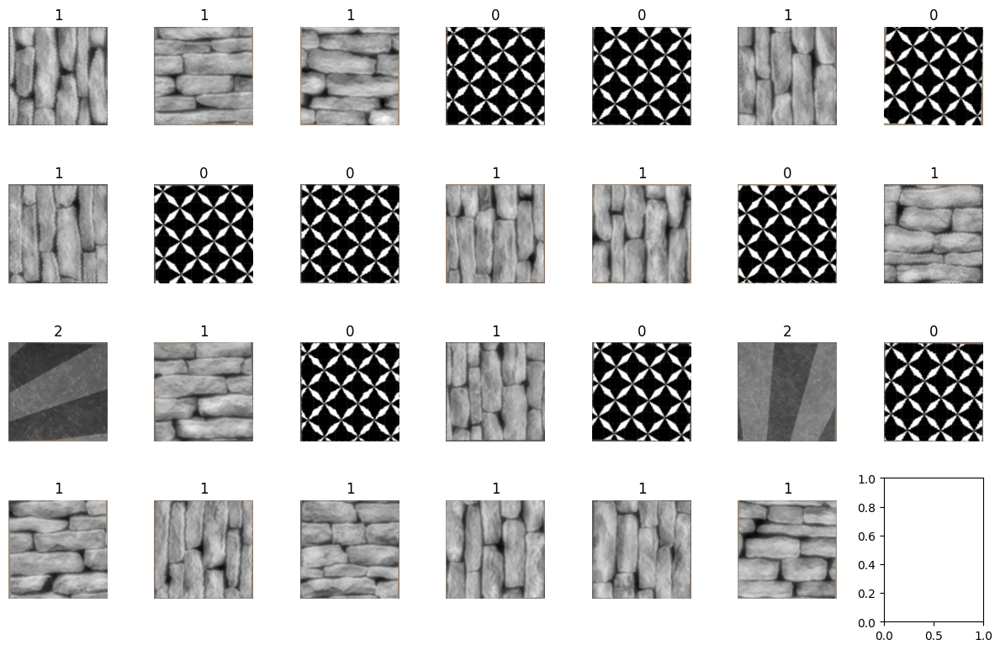

(27, 65)

4.0

PUZZLE:

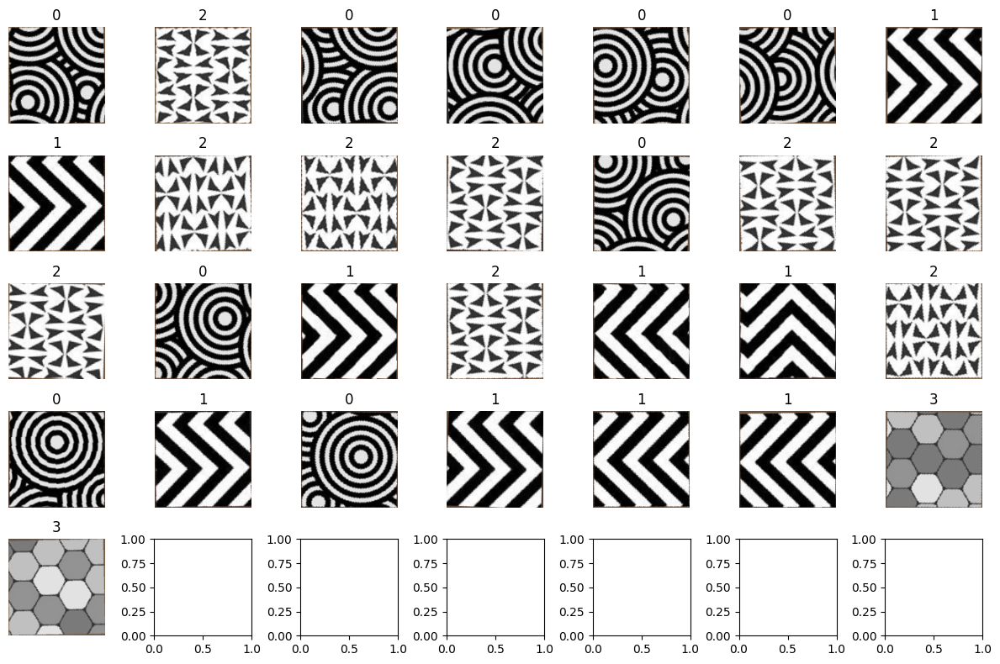

(29, 45)

3.0

PUZZLE:

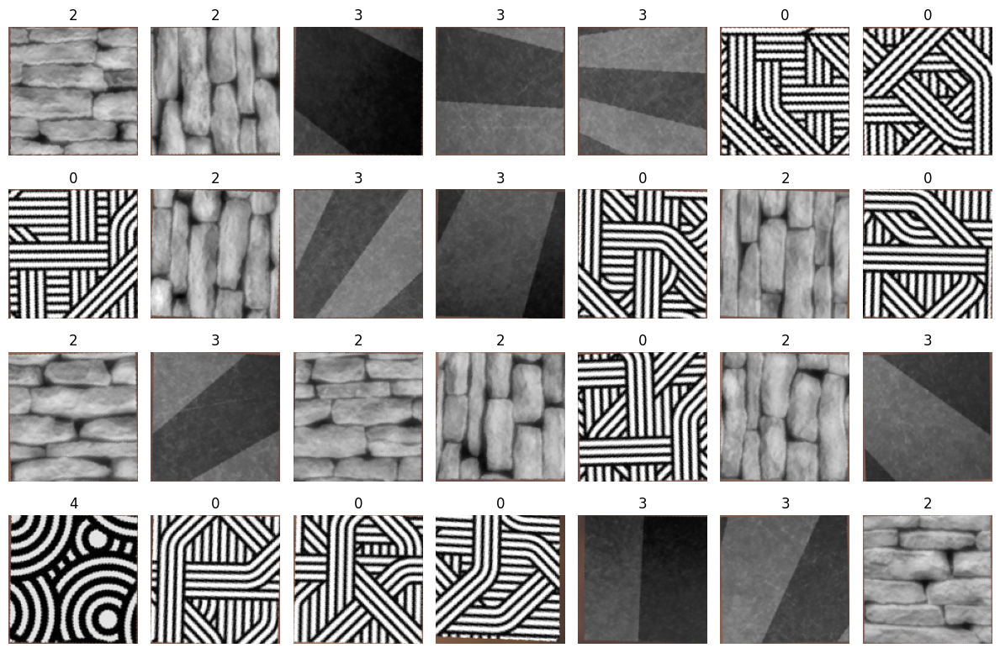

(28, 6)

3.0

PUZZLE:

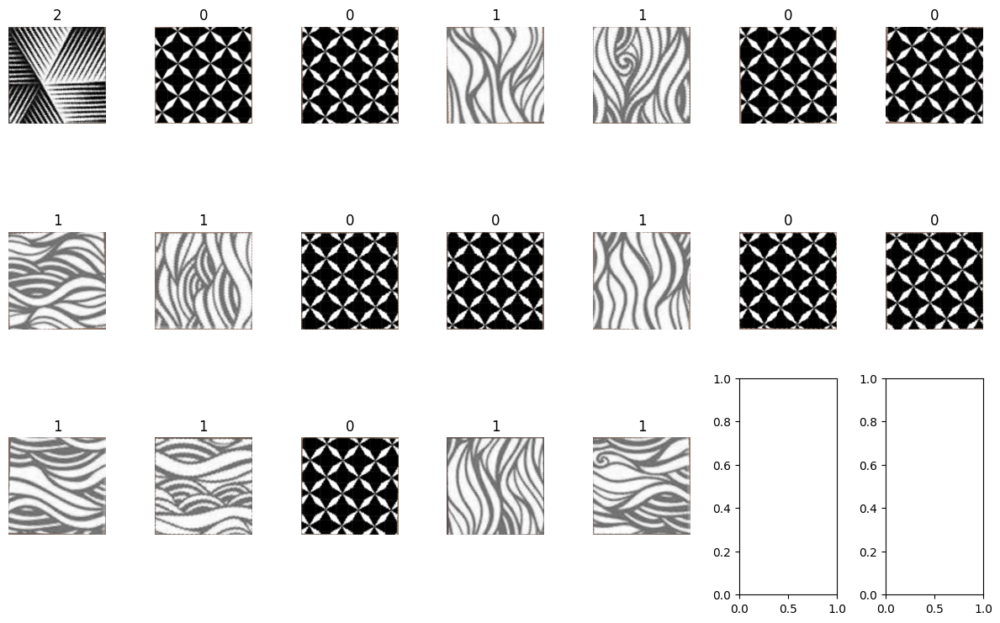

(19, 46)

saving solutions in folder:  data_project2/solutions_group_30

saving solutions in folder:  data_project2/solutions_group_30

saving solutions in folder:  data_project2/solutions_group_30

saving solutions in folder:  data_project2/solutions_group_30

saving solutions in folder:  data_project2/solutions_group_30

saving solutions in folder:  data_project2/solutions_group_30

saving solutions in folder:  data_project2/solutions_group_30

saving solutions in folder:  data_project2/solutions_group_30

saving solutions in folder:  data_project2/solutions_group_30

saving solutions in folder:  data_project2/solutions_group_30

saving solutions in folder:  data_project2/solutions_group_30

saving solutions in folder:  data_project2/solutions_group_30

In [25]:
%load_ext autoreload
%autoreload 2

from save_evaluation_files import *

solution_0 = tot_masks
solution_1 = []
solution_2 = []
for i, img in enumerate(tot_squares):
    cluster_labels, tot_img_solution_2, features = apply_clustering(img)
    print(features.shape)
    solution_1.append(features)
    solution_2.append(tot_img_solution_2)

for i in range(len(solution_1)):
    solutions = [solution_0[i], solution_1[i], solution_2[i]]
    export_solutions(i, solutions, group_id = "30")

## Evaluation metrics

The evaluation metrics will be liberated in the following days. 


## Gabor filters

$$ gb(x,y) = \exp \left( -\frac{1}{2} \left( \frac{x_{\theta}^2}{\sigma^2} + \frac{y_{\theta}^2}{(\Gamma\sigma)^2} \right) \right) \cos \left( \frac{2 \pi}{\lambda} x_{\theta} + \psi \right) $$
